# Manual clustering

This notebook pools `05_scvi.h5ad`, and then plots the UMAP, dotplot heatmap of favoured genes and DEGs 

In [2]:
#### ============================================================================
#### ANALYSIS SECTION: Cell Type Annotation and Subclustering
#### ============================================================================
#### This section generates plots similar to the R analysis script using Python/scanpy

In [1]:

from __future__ import annotations

import argparse
import gc
import importlib
from importlib.metadata import PackageNotFoundError, version
from pathlib import Path
import sys
import textwrap
import scvi
from scipy.sparse import issparse

import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc
from pathlib import Path
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


In [2]:
from pathlib import Path
import os

WORKING_DIRECTORY = Path("/Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations")
os.chdir(WORKING_DIRECTORY)

print(f"Working directory: {Path.cwd()}")

Working directory: /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations


In [3]:
adata = sc.read_h5ad(WORKING_DIRECTORY.parent / "04_SCVI" / "05_scvi.h5ad")

### Remove reference_ln sample
# Find and remove reference_ln cells
reference_mask = pd.Series(False, index=adata.obs_names)

columns_to_check = [
    "batch",
    "sample",
    "sample_id",
    "library_id",
    "dataset",
    "condition",
    "orig.ident",
]

for col in columns_to_check:
    if col in adata.obs.columns:
        reference_mask |= adata.obs[col].astype(str).str.contains(
            "reference_ln", case=False, na=False
        )

reference_mask |= pd.Index(adata.obs_names).astype(str).str.contains(
    "reference_ln", case=False, na=False
)

print(f"Cells before filtering: {adata.n_obs:,}")
print(f"reference_ln cells removed: {reference_mask.sum():,}")

adata_no_ref = adata[~reference_mask].copy()

# Keep only your tissue samples
adata_no_ref = adata_no_ref[
    adata_no_ref.obs["batch"].astype(str).isin(["AD_inf", "AD_mock"])
].copy()

if hasattr(adata_no_ref.obs["batch"], "cat"):
    adata_no_ref.obs["batch"] = adata_no_ref.obs["batch"].cat.remove_unused_categories()

print(f"Cells after removing reference_ln and keeping AD_inf/AD_mock: {adata_no_ref.n_obs:,}")
print(adata_no_ref.obs["batch"].value_counts())

Cells before filtering: 158,112
reference_ln cells removed: 38,318
Cells after removing reference_ln and keeping AD_inf/AD_mock: 119,794
batch
AD_mock    64377
AD_inf     55417
Name: count, dtype: int64


In [4]:

random_seed = globals().get("random_seed", 0)
# Work only on no-reference AD_inf/AD_mock object
adata_clust = adata_no_ref.copy()

# Remove old graph/UMAP/clustering so nothing stale is reused
for key in ["neighbors", "neighbors_no_reference_ln", "neighbors_scvi_clean"]:
    adata_clust.uns.pop(key, None)

for key in ["connectivities", "distances"]:
    adata_clust.obsp.pop(key, None)

adata_clust.obsm.pop("X_umap", None)

# Recompute neighbors from scVI latent
sc.pp.neighbors(
    adata_clust,
    use_rep="X_scVI",
    n_neighbors=50,      # smoother than 15/30
    metric="cosine",     # often better for latent embeddings
    random_state=0,
    key_added="neighbors_scvi_clean",
)

sc.tl.umap(
    adata_clust,
    neighbors_key="neighbors_scvi_clean",
    min_dist=0.15,       # lower = tighter visual groups
    spread=1.0,
    random_state=0,
)

sc.tl.leiden(
    adata_clust,
    neighbors_key="neighbors_scvi_clean",
    resolution=0.4,      # start lower
    random_state=0,
    key_added="leiden_scvi_clean",
)

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_60538/381566068.py:32: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(


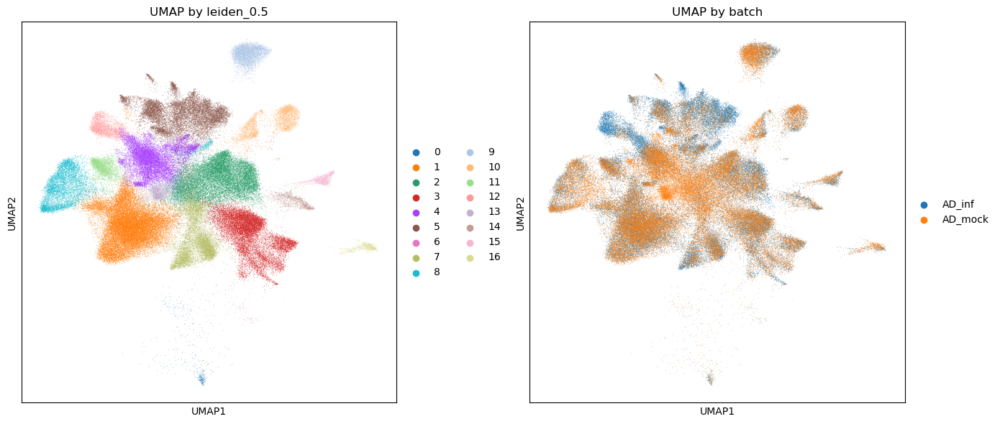

Cell counts per leiden cluster:
leiden
0       429
1     26364
2     16318
3     14187
4     13393
5     13269
6       128
7      8738
8      7428
9      4551
10     4004
11     3294
12     2573
13     1967
14     1401
15     1085
16      665
Name: count, dtype: int64


In [8]:
# UMAP plots by leiden_0.5 and batch
if "X_umap" not in adata_no_ref.obsm:
    print("UMAP embedding missing; computing from the existing neighbors graph.")
    sc.tl.umap(adata_no_ref, neighbors_key=neighbors_key, random_state=random_seed)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sc.pl.umap(adata_no_ref, color="leiden", ax=axes[0], show=False, title="UMAP by leiden_0.5")
sc.pl.umap(adata_no_ref, color="batch", ax=axes[1], show=False, title="UMAP by batch")
plt.tight_layout()
plt.savefig("leiden_0.5_cluster_umap.png", dpi=300, bbox_inches="tight")
plt.show()

print(f"Cell counts per leiden cluster:")
print(adata_no_ref.obs['leiden'].value_counts().sort_index())


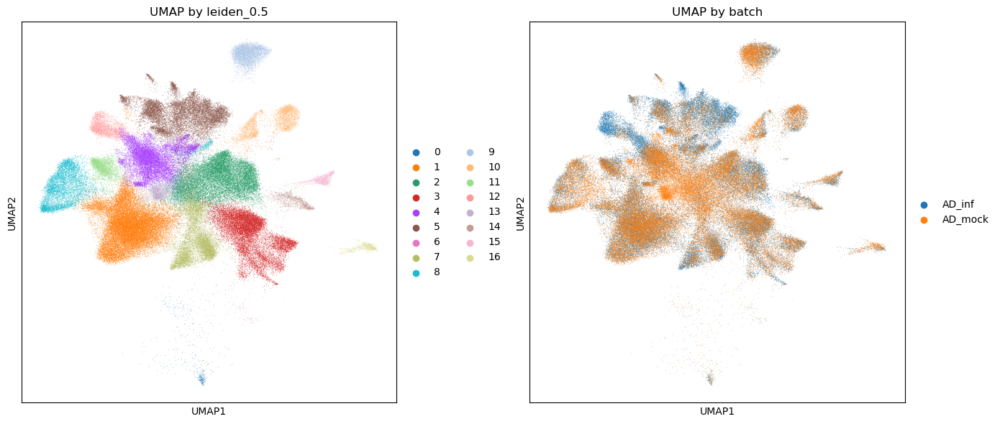

Cell counts per leiden cluster:
leiden
0       429
1     26364
2     16318
3     14187
4     13393
5     13269
6       128
7      8738
8      7428
9      4551
10     4004
11     3294
12     2573
13     1967
14     1401
15     1085
16      665
Name: count, dtype: int64


In [9]:

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sc.pl.umap(adata_no_ref, color="leiden", ax=axes[0], show=False, title="UMAP by leiden_0.5")
sc.pl.umap(adata_no_ref, color="batch", ax=axes[1], show=False, title="UMAP by batch")
plt.tight_layout()
plt.show()

print(f"Cell counts per leiden cluster:")
print(adata_no_ref.obs['leiden'].value_counts().sort_index())

### Spatial plotting helper

In [11]:
def get_spatial_xy_for_plot(adata_obj):
    if {"x_centroid", "y_centroid"}.issubset(adata_obj.obs.columns):
        return adata_obj.obs[["x_centroid", "y_centroid"]].to_numpy(dtype=float)
    if "X_spatial" in adata_obj.obsm:
        return np.asarray(adata_obj.obsm["X_spatial"][:, :2], dtype=float)
    if "spatial" in adata_obj.obsm:
        return np.asarray(adata_obj.obsm["spatial"][:, :2], dtype=float)
    raise KeyError("Could not find spatial coordinates.")


def plot_one_batch_spatial(
    adata_obj,
    batch_name,
    color="leiden_no_reference_ln",
    s=0.25,
    save=None,
):
    adata_batch = adata_obj[adata_obj.obs["batch"].astype(str) == batch_name].copy()
    xy = get_spatial_xy_for_plot(adata_batch)

    values = adata_batch.obs[color].astype("category")
    codes = values.cat.codes.to_numpy()
    categories = list(values.cat.categories)

    cmap = plt.get_cmap("tab20", max(len(categories), 1))

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(
        xy[:, 0],
        xy[:, 1],
        c=codes,
        cmap=cmap,
        s=s,
        linewidths=0,
        rasterized=True,
    )

    ax.set_title(f"{batch_name}: {color}")
    ax.set_xlabel("x_centroid")
    ax.set_ylabel("y_centroid")
    ax.set_aspect("equal", adjustable="box")
    ax.invert_yaxis()

    handles = [
        plt.Line2D(
            [0],
            [0],
            marker="o",
            linestyle="",
            markersize=5,
            markerfacecolor=cmap(i),
            markeredgecolor="none",
            label=str(cat),
        )
        for i, cat in enumerate(categories)
    ]

    ax.legend(
        handles=handles,
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
        frameon=False,
        fontsize=8,
    )

    plt.tight_layout()

    if save is not None:
        fig.savefig(save, dpi=300, bbox_inches="tight")
        print(f"Saved {save}")

    plt.show()

### Spatial plots

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/spatial_split_by_batch_no_reference_ln/AD_inf_spatial_leiden_no_reference_ln.png


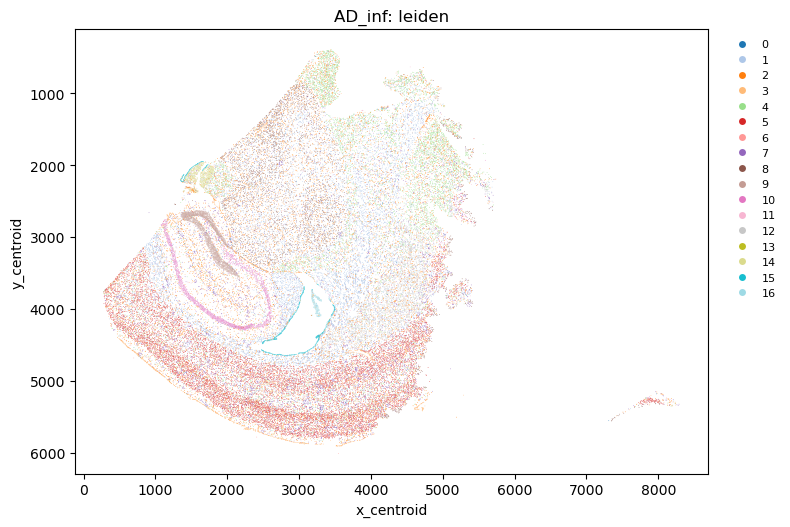

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/spatial_split_by_batch_no_reference_ln/AD_mock_spatial_leiden_no_reference_ln.png


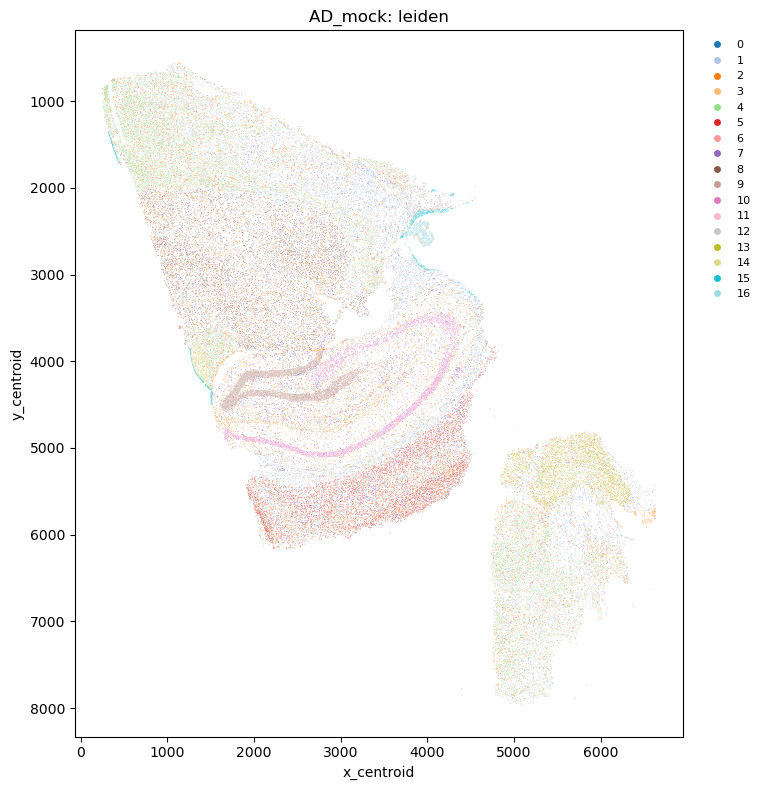

In [12]:
plot_dir = WORKING_DIRECTORY / "spatial_split_by_batch_no_reference_ln"
plot_dir.mkdir(parents=True, exist_ok=True)

plot_one_batch_spatial(
    adata_no_ref,
    "AD_inf",
    color="leiden",
    save=plot_dir / "AD_inf_spatial_leiden_no_reference_ln.png",
)

plot_one_batch_spatial(
    adata_no_ref,
    "AD_mock",
    color="leiden",
    save=plot_dir / "AD_mock_spatial_leiden_no_reference_ln.png",
)



In [13]:
# Copy MapMyCells annotations from adata into adata_no_ref
mapmycells_cols = [c for c in adata.obs.columns if c.startswith("mapmycells_")]

print("MapMyCells cols in adata:", mapmycells_cols)
print("Before copy, MapMyCells cols in adata_no_ref:", [c for c in adata_no_ref.obs.columns if c.startswith("mapmycells_")])

adata_no_ref.obs = adata_no_ref.obs.drop(
    columns=[c for c in adata_no_ref.obs.columns if c.startswith("mapmycells_")],
    errors="ignore",
)

adata_no_ref.obs = adata_no_ref.obs.join(
    adata.obs.loc[adata_no_ref.obs_names, mapmycells_cols],
    how="left",
)

for col in mapmycells_cols:
    if col in adata_no_ref.obs.columns and "probability" not in col:
        adata_no_ref.obs[col] = adata_no_ref.obs[col].astype("category")

print("After copy, MapMyCells cols in adata_no_ref:")
print([c for c in adata_no_ref.obs.columns if c.startswith("mapmycells_")])

print(
    "Matched mapmycells_class_name:",
    adata_no_ref.obs["mapmycells_class_name"].notna().sum(),
    "/",
    adata_no_ref.n_obs,
)

plot_dir = WORKING_DIRECTORY / "spatial_split_by_batch_no_reference_ln"
plot_dir.mkdir(parents=True, exist_ok=True)

for batch_name in ["AD_inf", "AD_mock"]:
    plot_one_batch_spatial(
        adata_no_ref,
        batch_name,
        color="mapmycells_class_name",
        save=plot_dir / f"{batch_name}_spatial_mapmycells_class_name.png",
    )

MapMyCells cols in adata: []
Before copy, MapMyCells cols in adata_no_ref: []
After copy, MapMyCells cols in adata_no_ref:
[]


KeyError: 'mapmycells_class_name'

### Plot genes of interest on feature plots, violin plots, dotplots for annotation

In [ ]:
# Load gene lists for marker visualization
# Replace this path with your actual clustering guide file
gene_guide_path = Path("~/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/Gene List of sub-clustering/BRAIN_CLUSTERING_GUIDE_IRENE_Vs.xlsx").expanduser()

if gene_guide_path.exists():
    gene_guide = pd.read_excel(gene_guide_path, sheet_name="Long_format_all_genes")
    print(f"Loaded gene guide with {len(gene_guide)} entries")
    print(f"Gene types: {gene_guide['Type'].unique()}")
else:
    print(f"⚠️ Gene guide not found at {gene_guide_path}")
    print("Define genes manually or update the path.")
    gene_guide = None


Loaded gene guide with 197 entries
Gene types: ['Bcells' 'Tcells' 'NKcells' 'Monocytes' 'Macrophages' 'Microglia'
 'Astrocytes' 'OPCs' 'Oligodendrocytes' 'excitatory_neurons'
 'Inhibitory_nuerons' 'Endothelial_cells' 'DAM_microglia' 'Hom_microglia'
 'DAM_stage1' 'DAM_stage2' 'cd8_exh_int' 'cd8_exh_prog' 'cd8_exh_term'
 'cd8_effector_like' 'Dendritic Cells']


/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


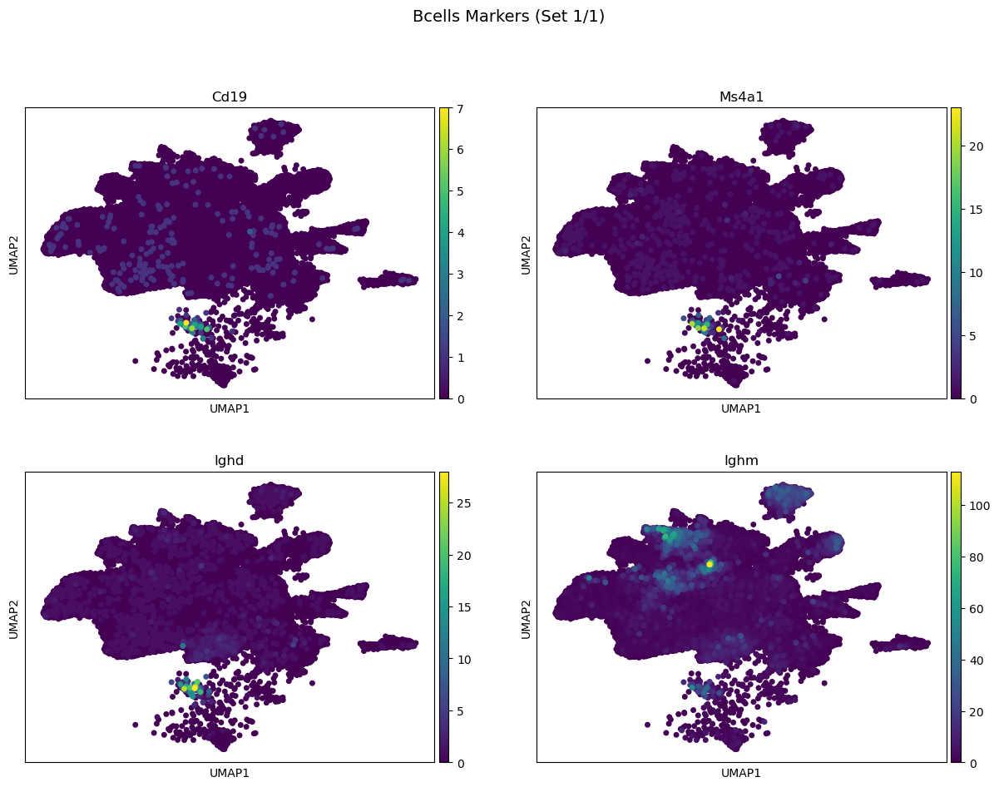

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


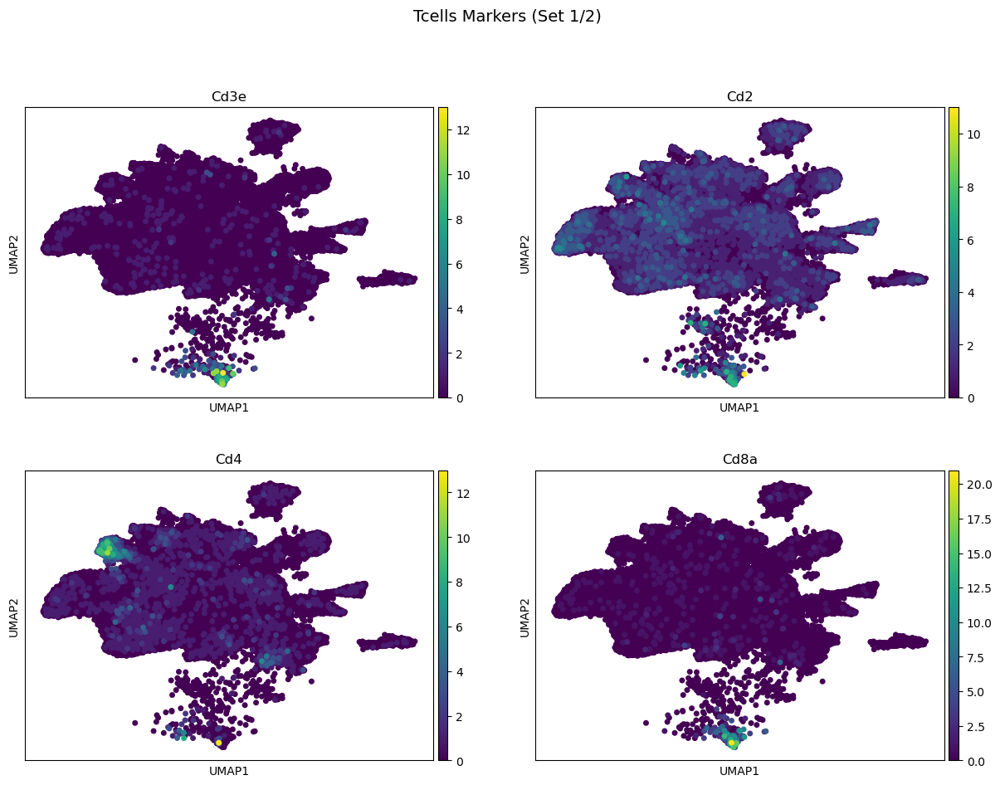

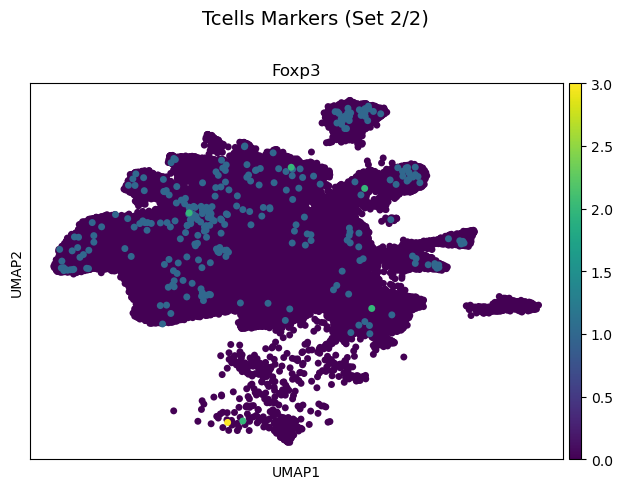

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


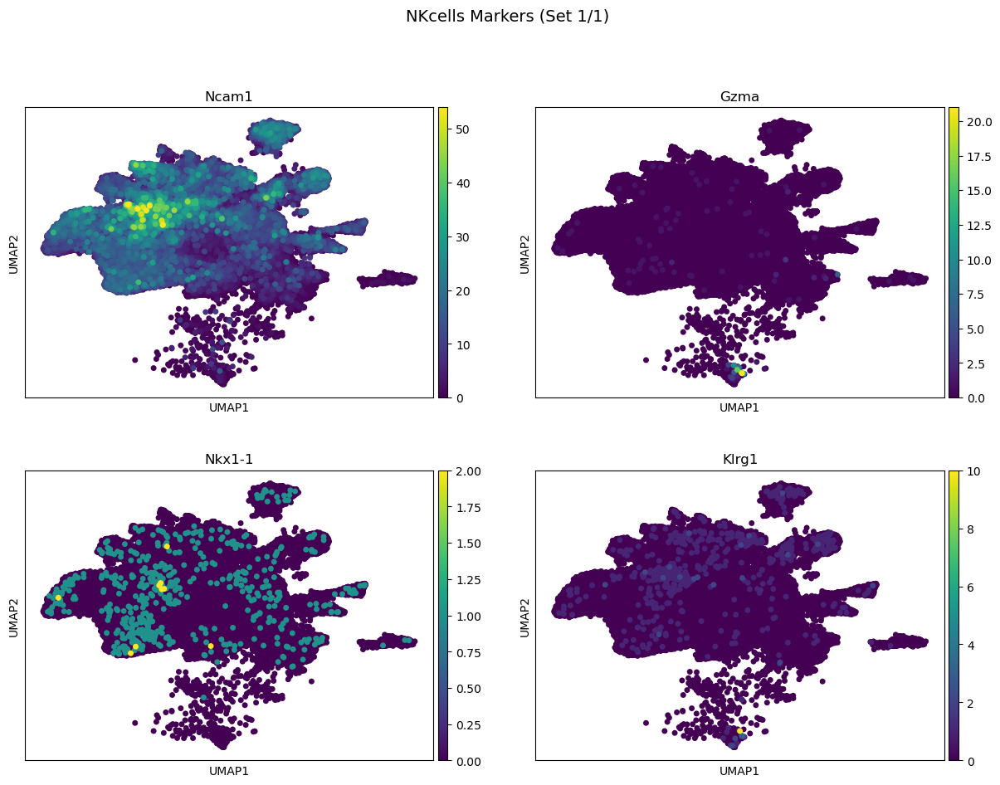

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


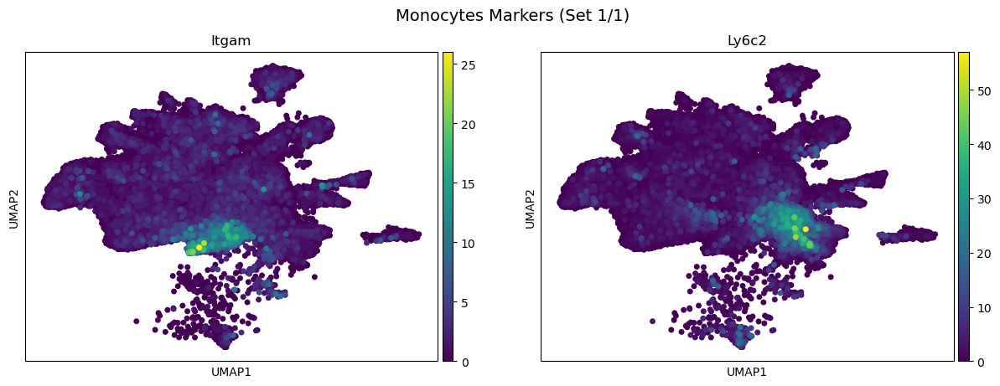

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


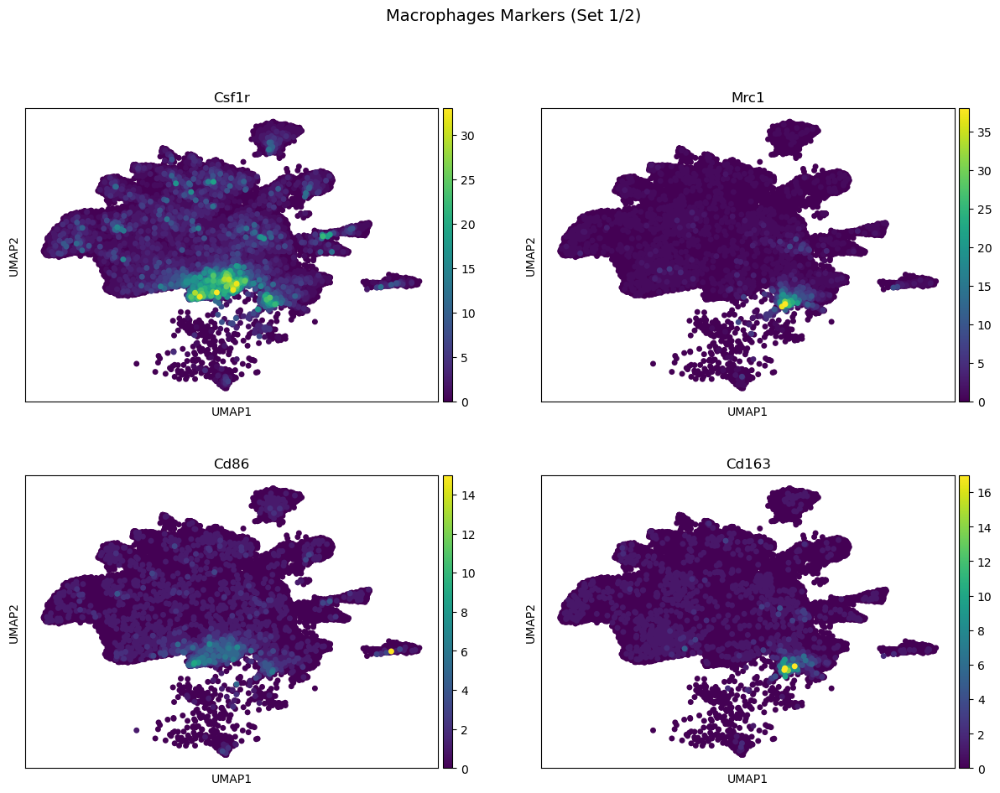

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


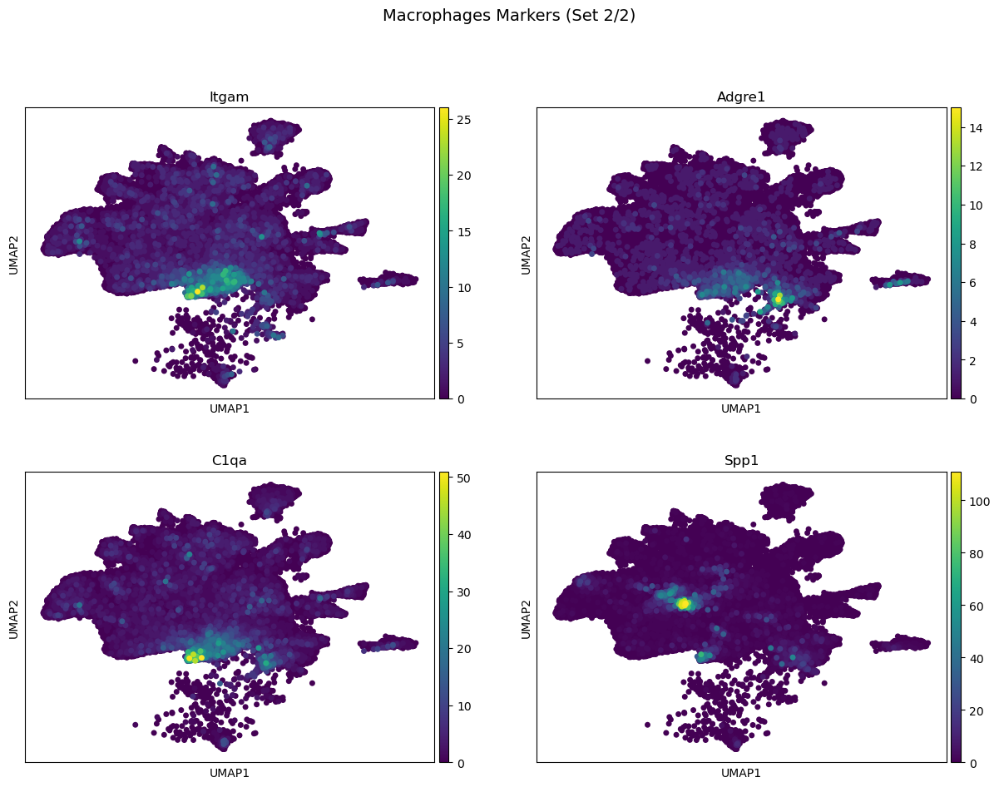

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


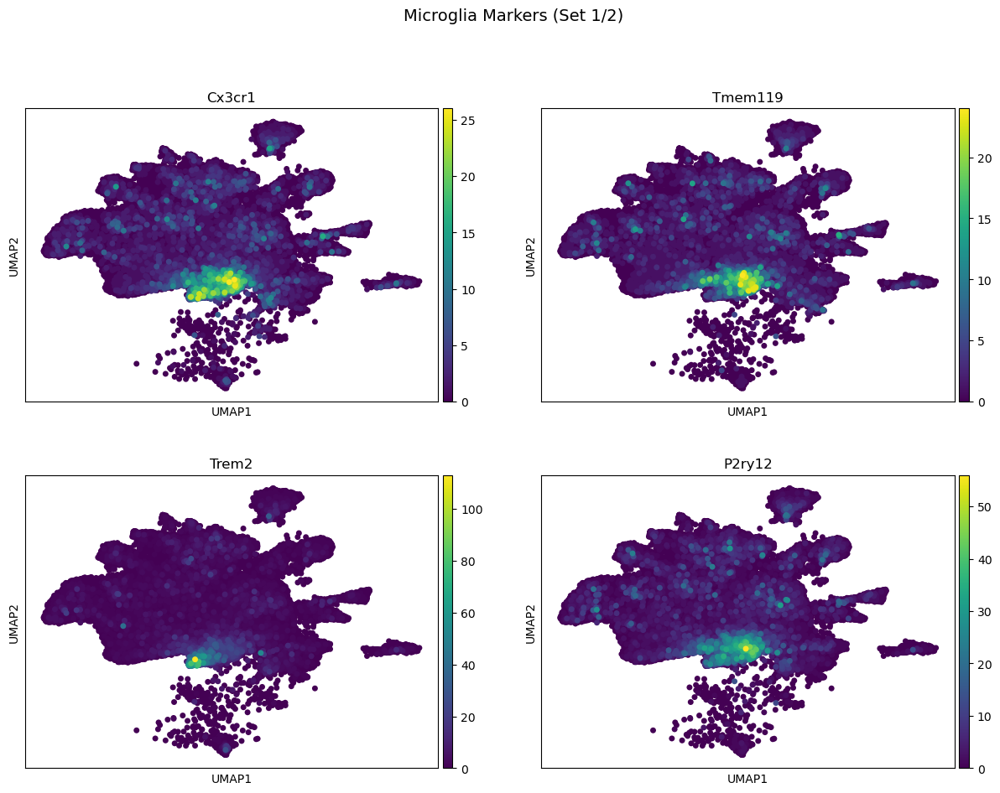

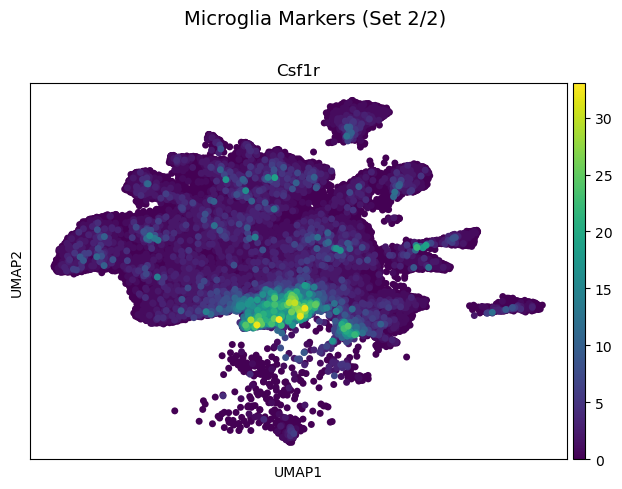

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


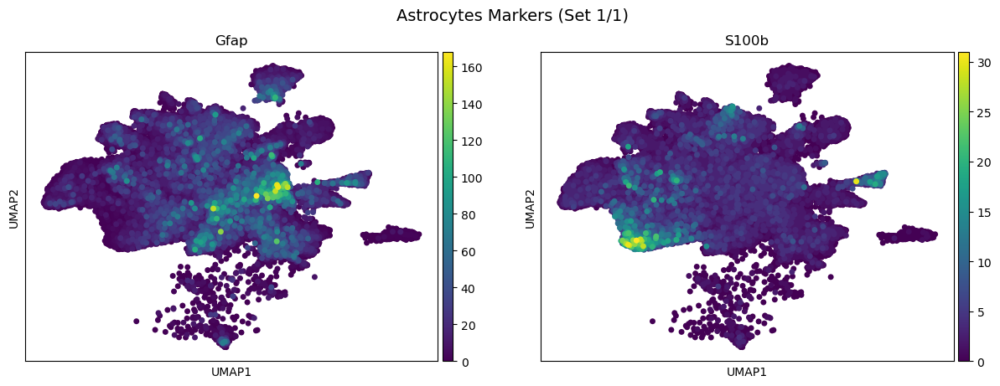

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


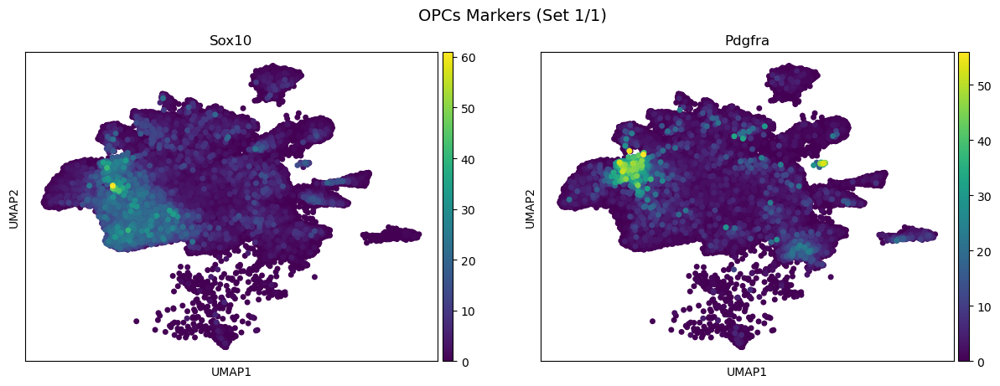

⚠️ No genes found for Oligodendrocytes


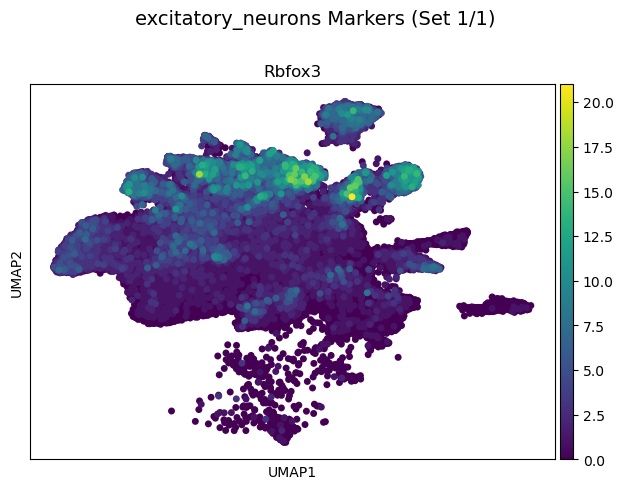

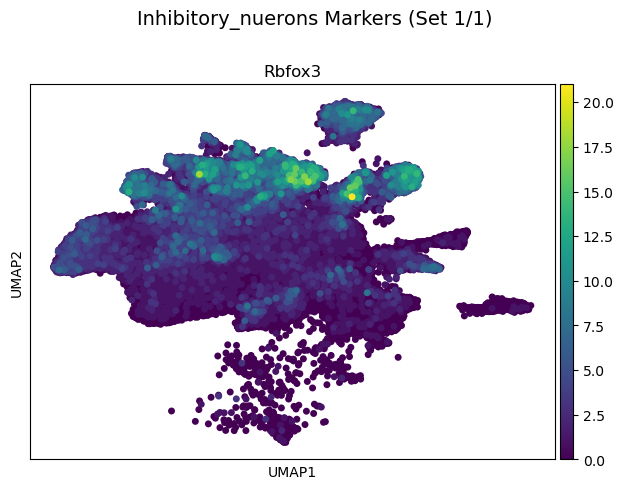

⚠️ No genes found for Endothelial_cells


/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


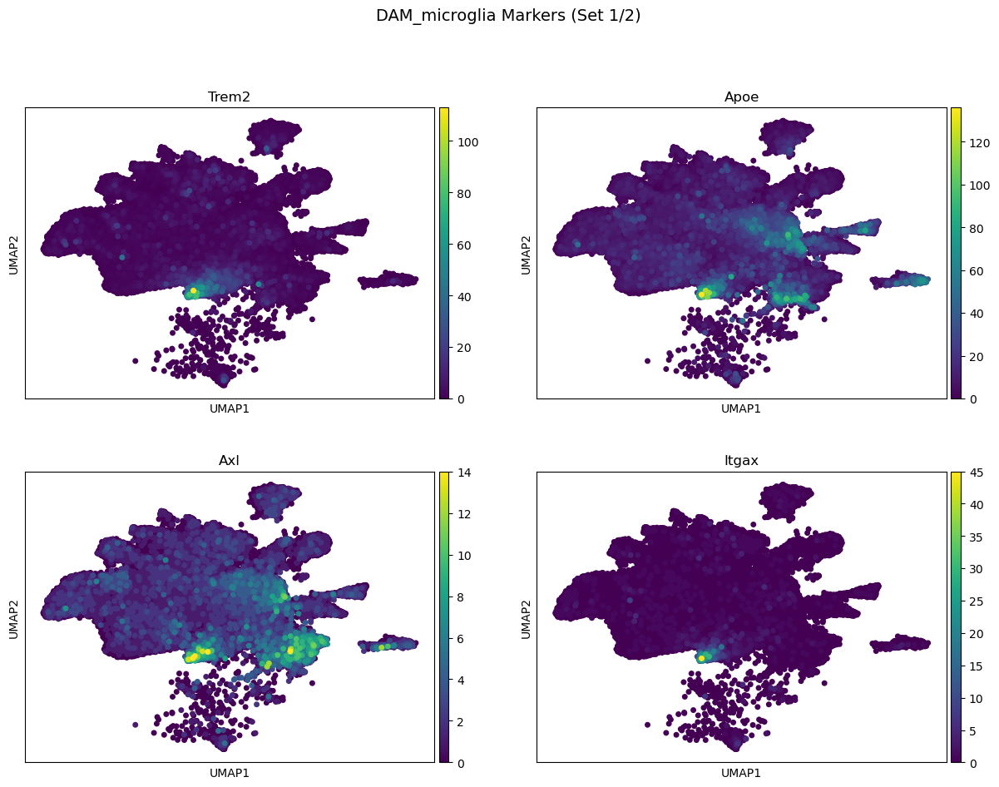

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


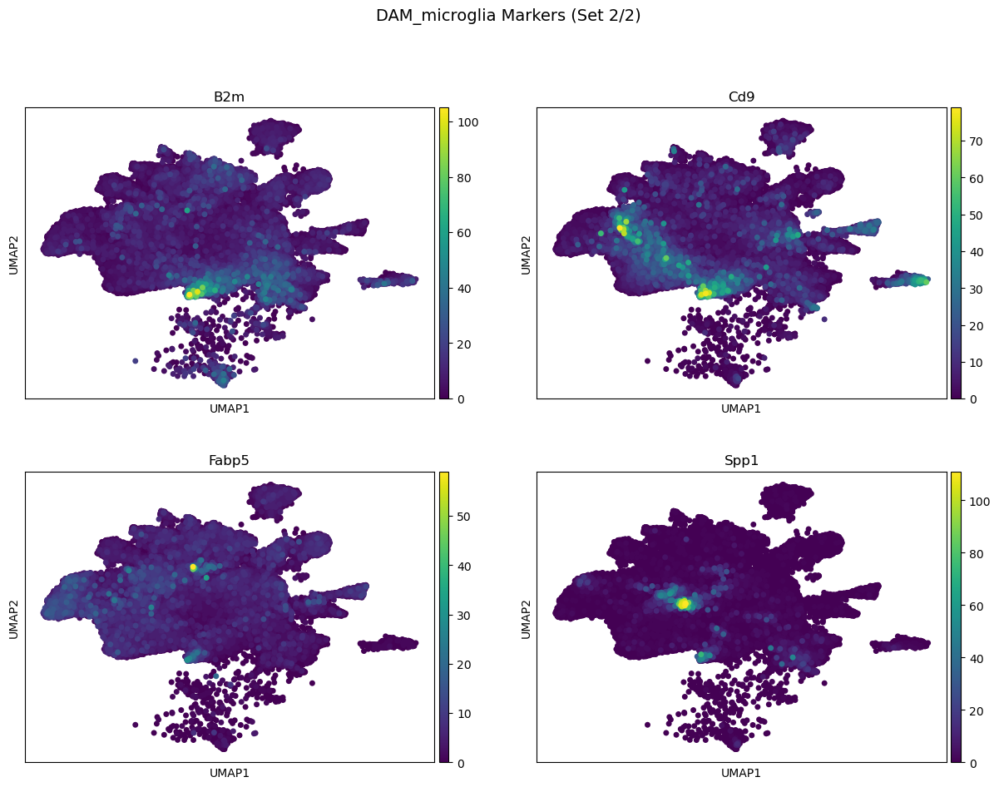

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


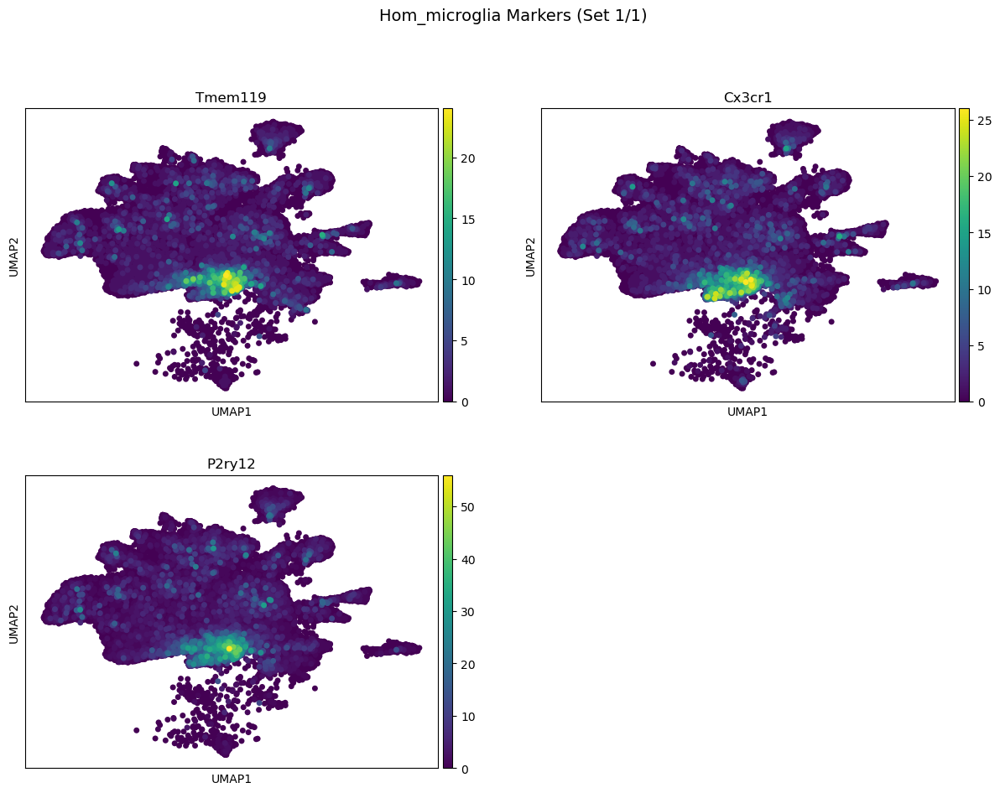

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


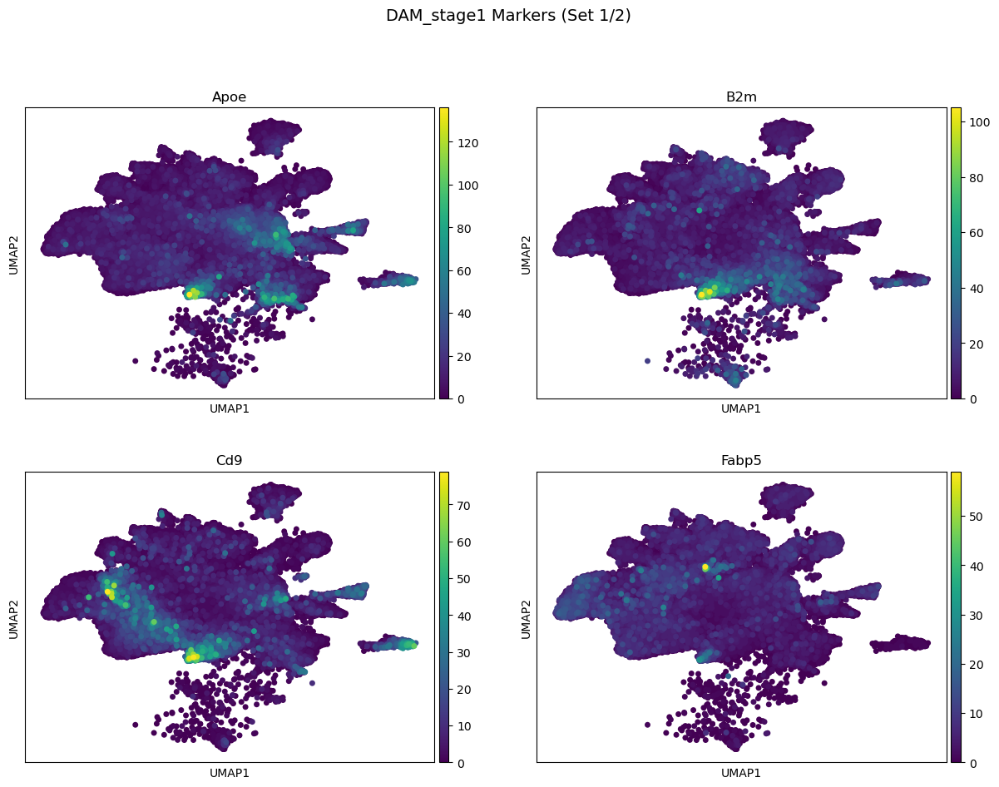

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


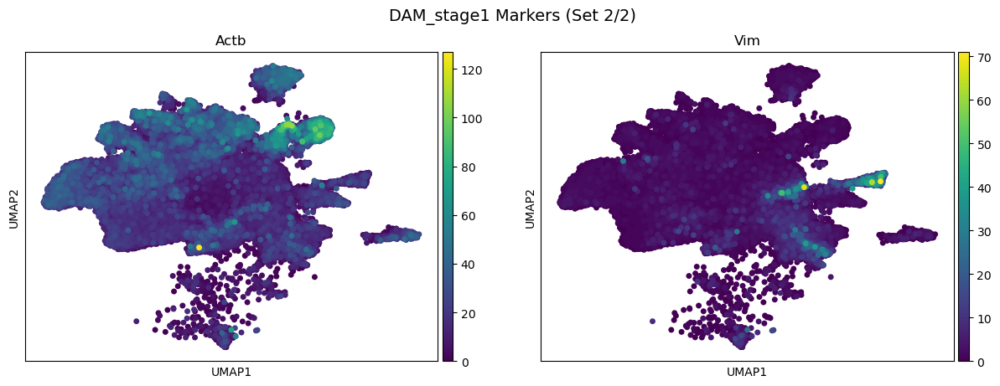

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


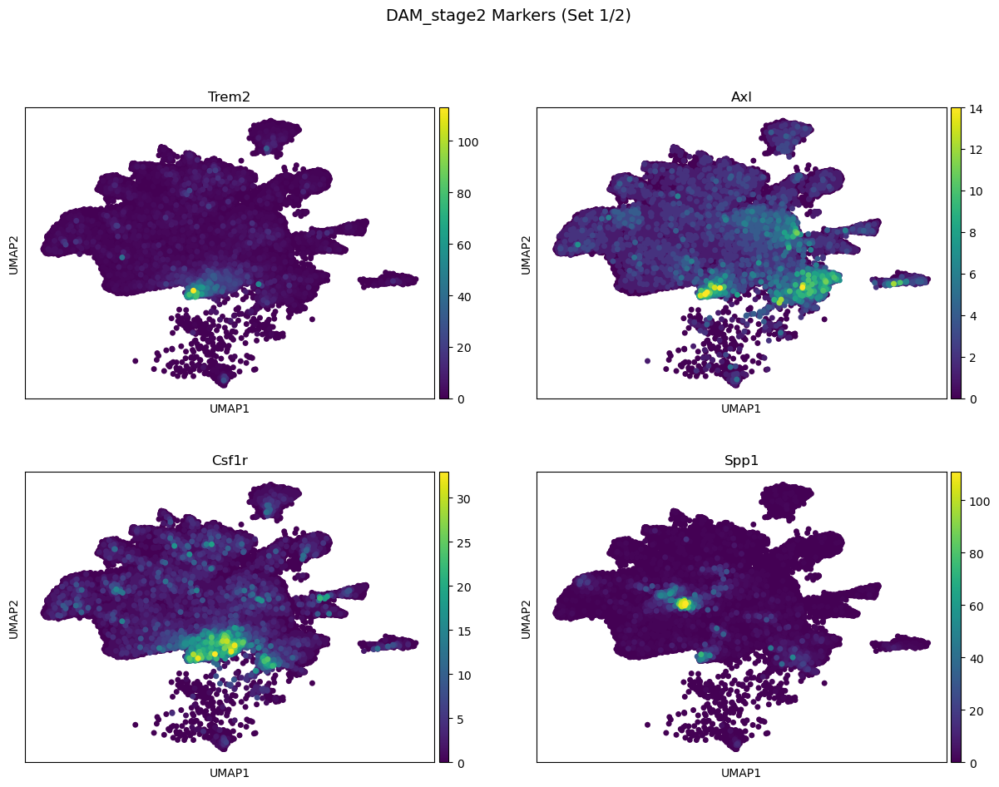

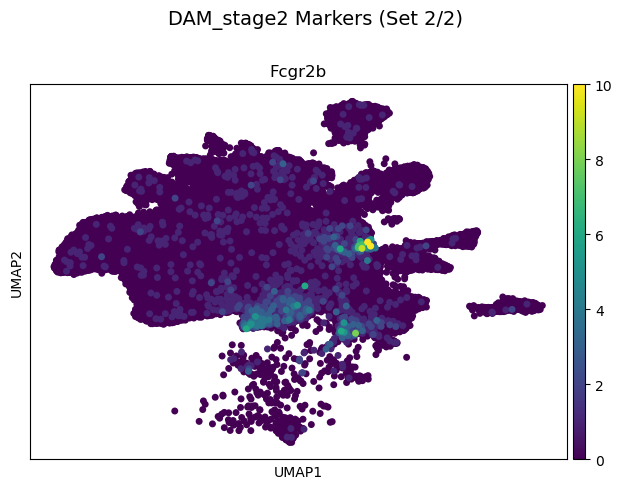

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


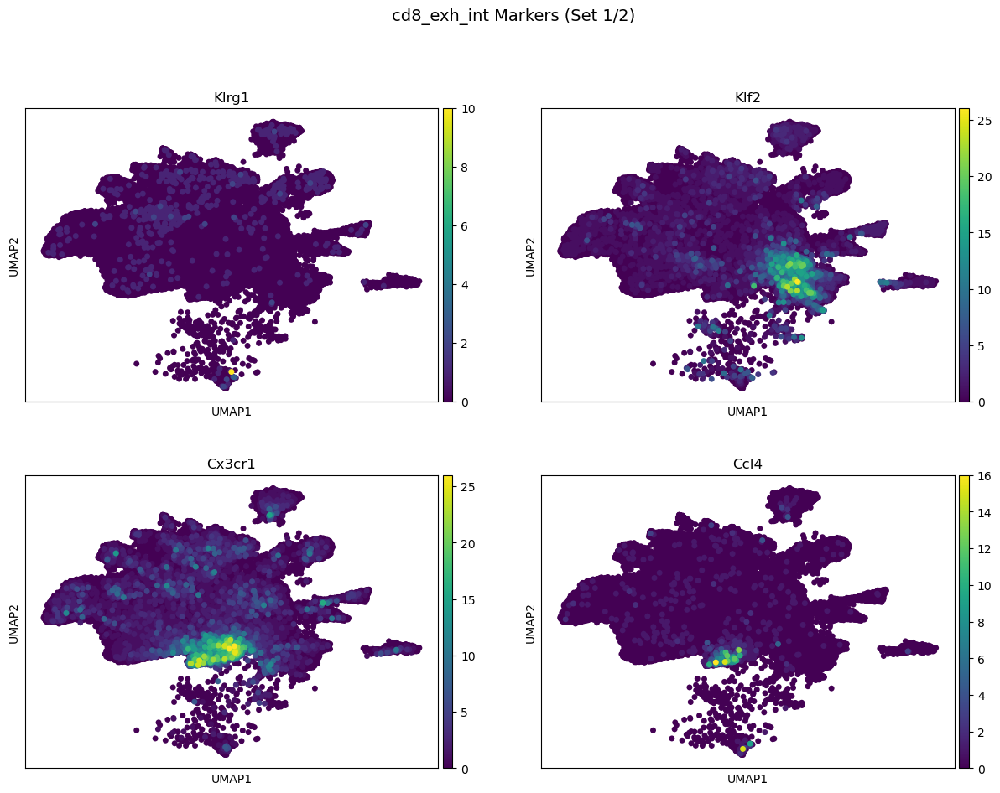

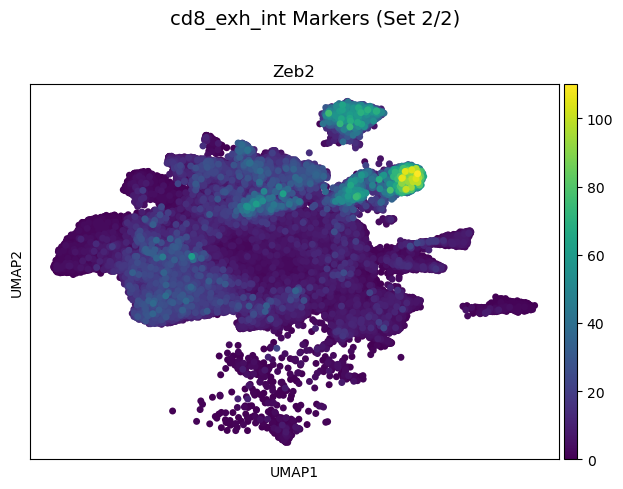

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


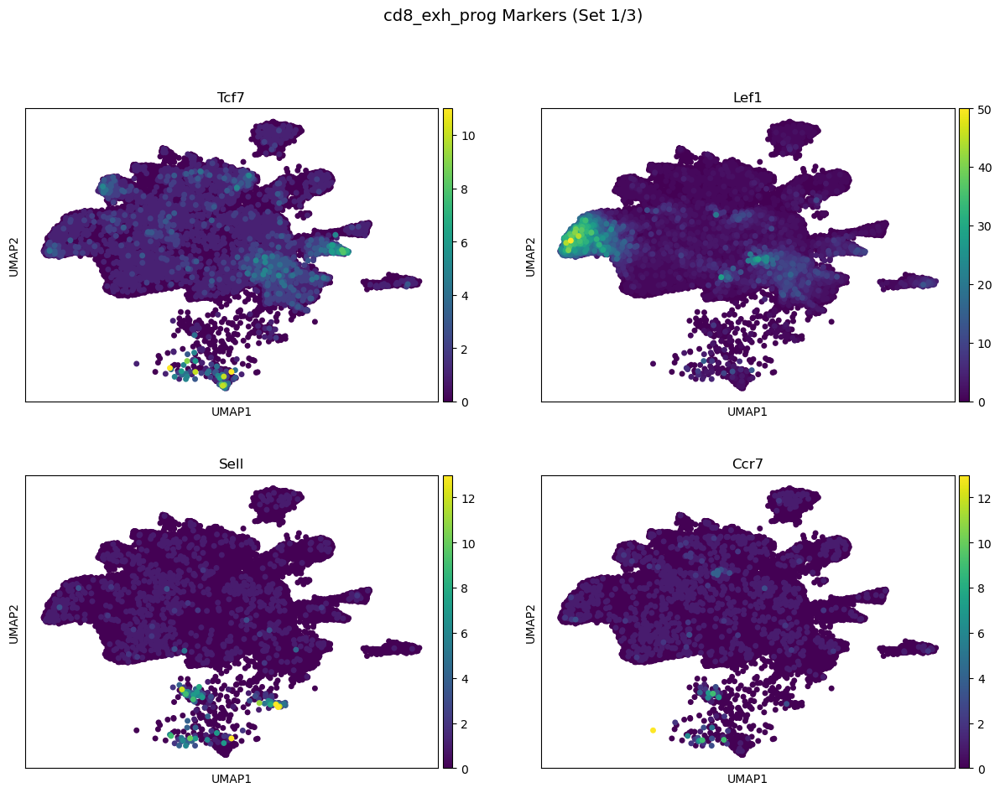

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


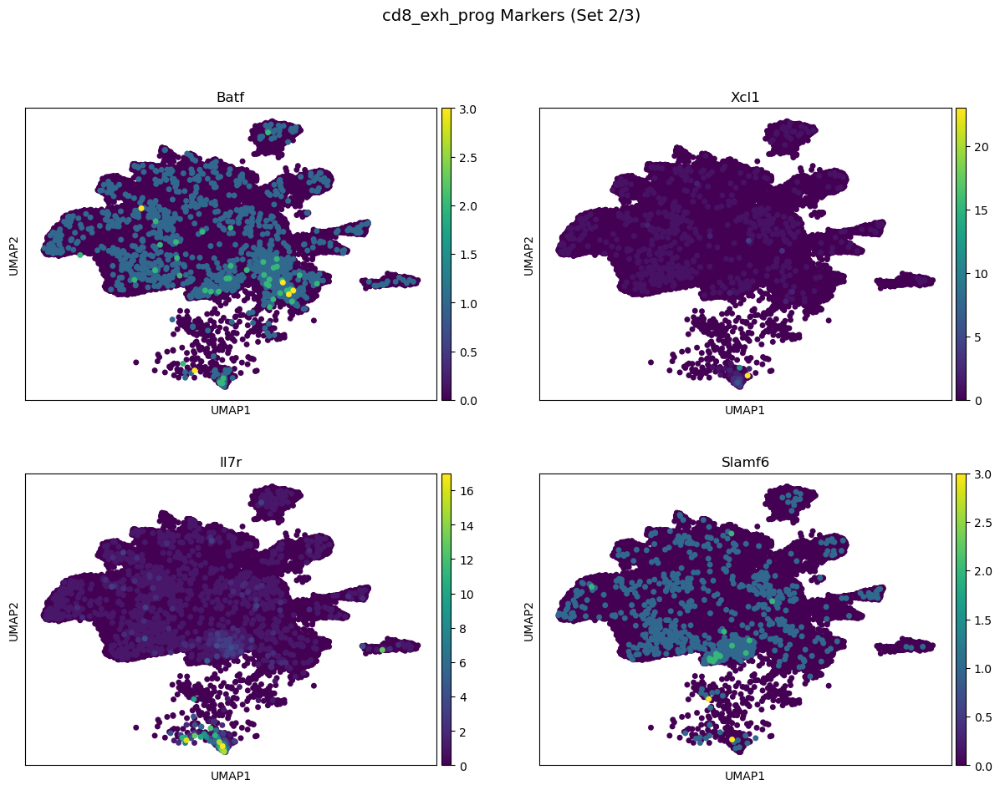

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


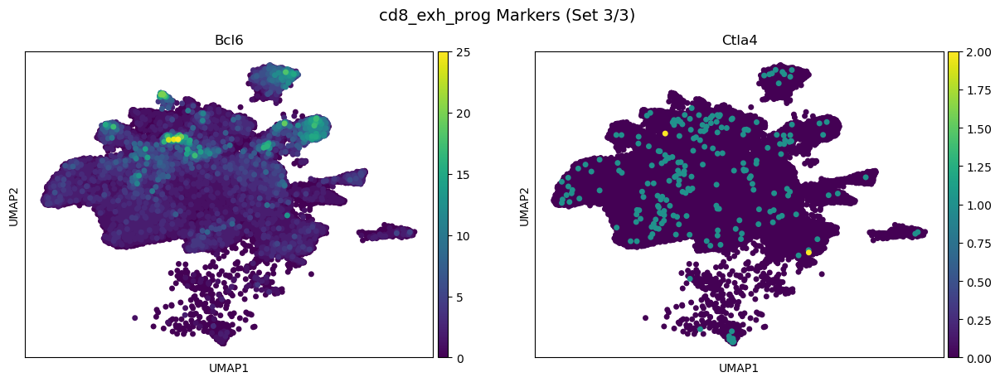

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


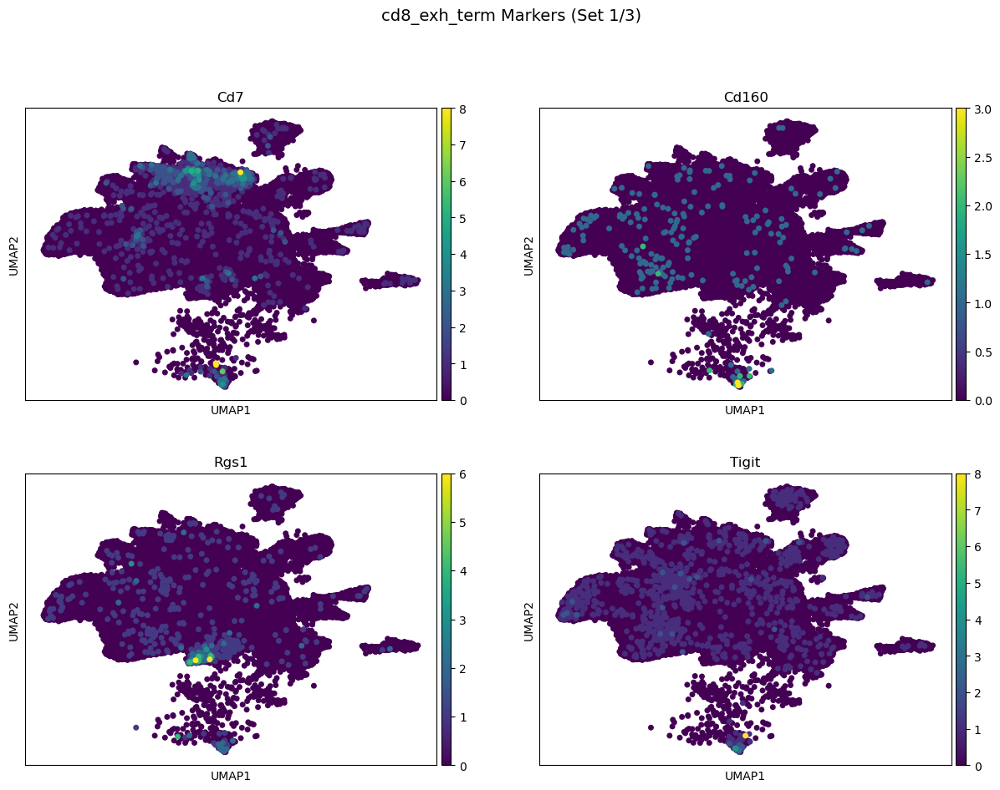

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


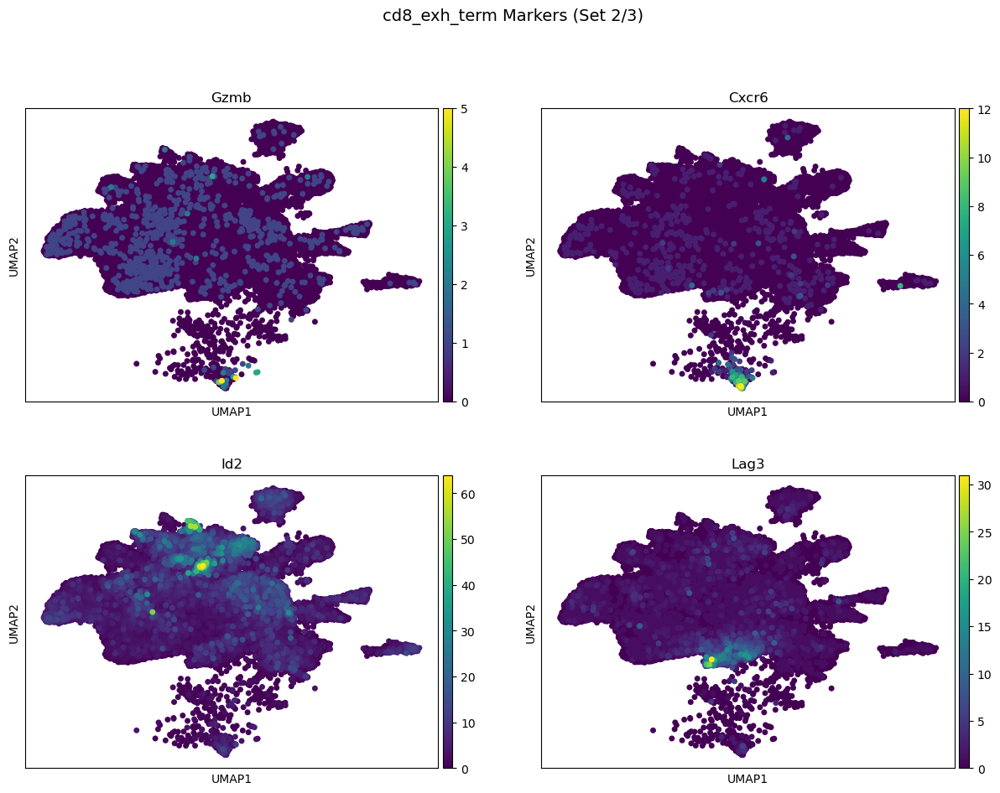

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


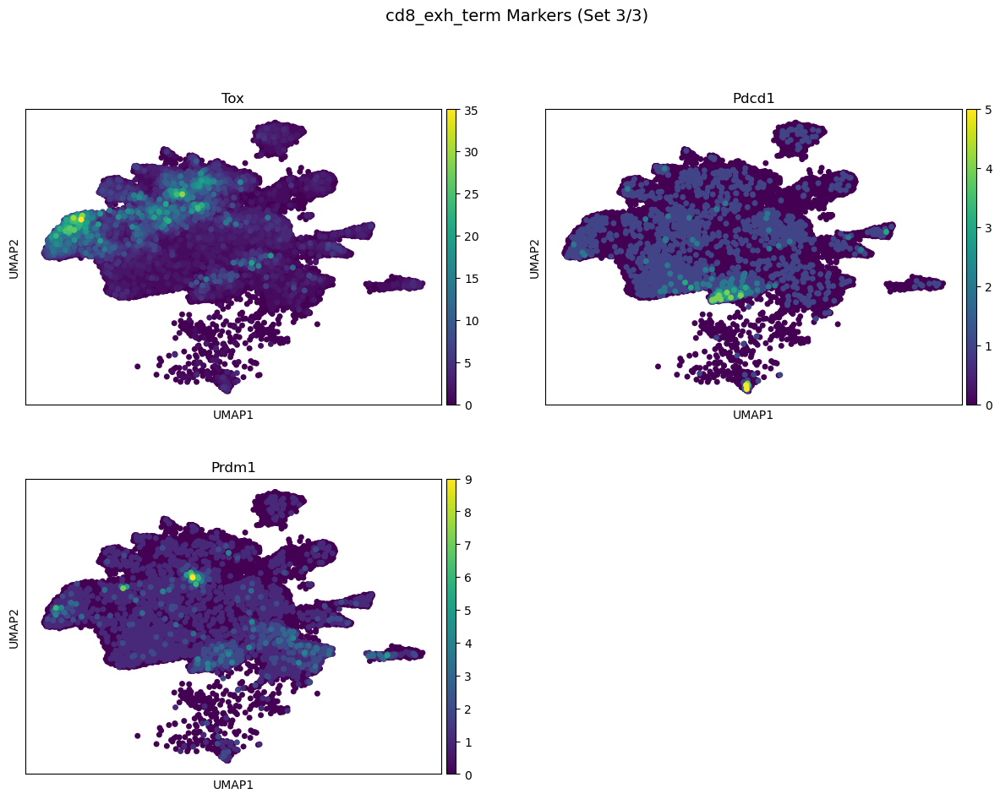

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


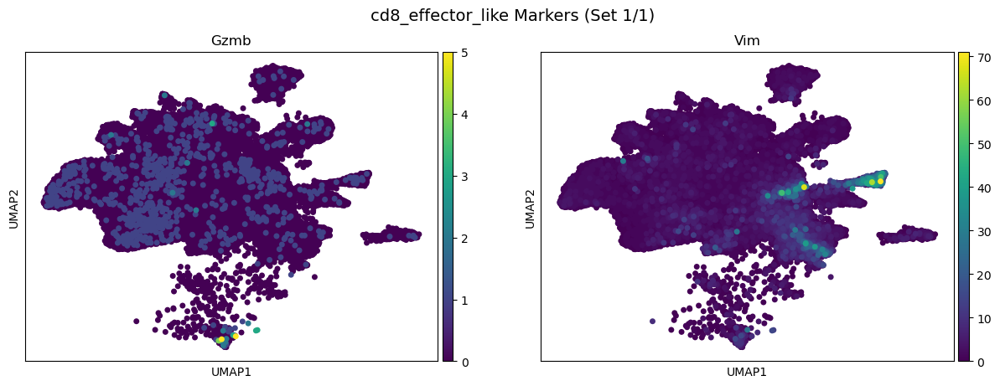

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_3472/1973996131.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


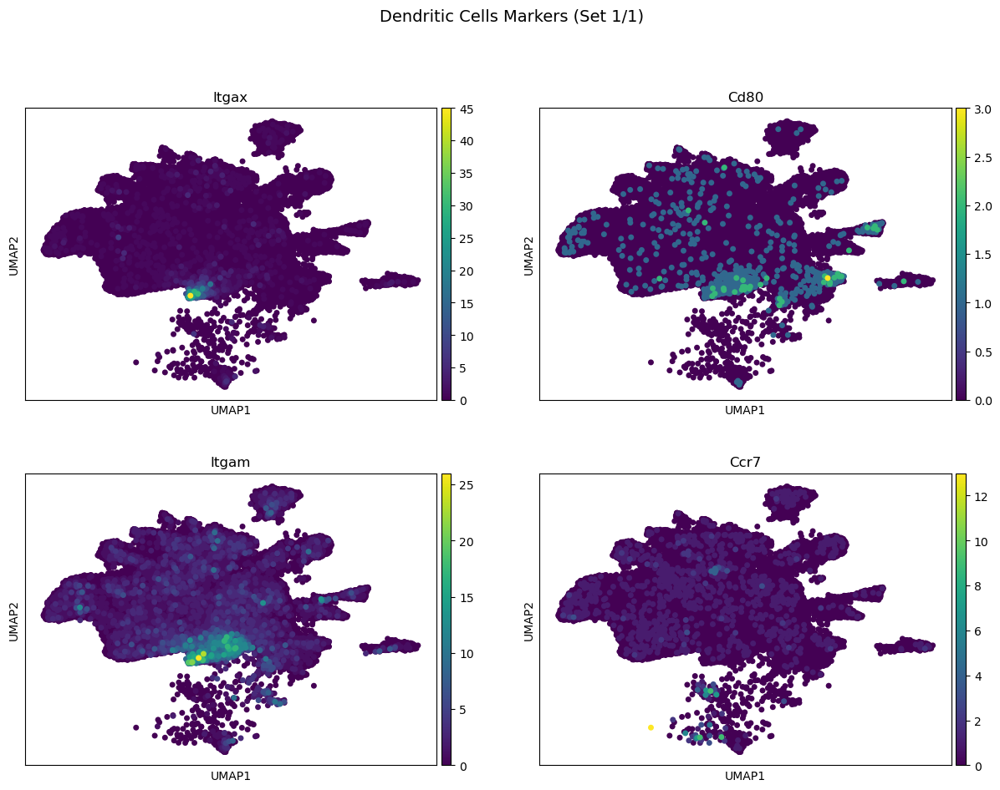

In [ ]:
# Feature plots for marker genes
if gene_guide is not None:
    for celltype in gene_guide['Type'].unique():
        genes = gene_guide[gene_guide['Type'] == celltype]['Gene'].unique()
        # Filter genes that exist in the object
        genes_present = [g for g in genes if g in adata.var_names]
        
        if len(genes_present) == 0:
            print(f"⚠️ No genes found for {celltype}")
            continue
        
        # Split genes into groups of 4 for easier visualization
        gene_chunks = [genes_present[i:i+4] for i in range(0, len(genes_present), 4)]
        
        for i, gene_set in enumerate(gene_chunks):
            sc.pl.umap(adata, color=gene_set, ncols=2, size=100, show=False)
            plt.suptitle(f"{celltype} Markers (Set {i+1}/{len(gene_chunks)})", fontsize=14, y=1.01)
            plt.tight_layout()
            plt.show()

/var/folders/82/6l796mmn2fj1pv97hrt8rh1h0000gp/T/ipykernel_60538/469906554.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


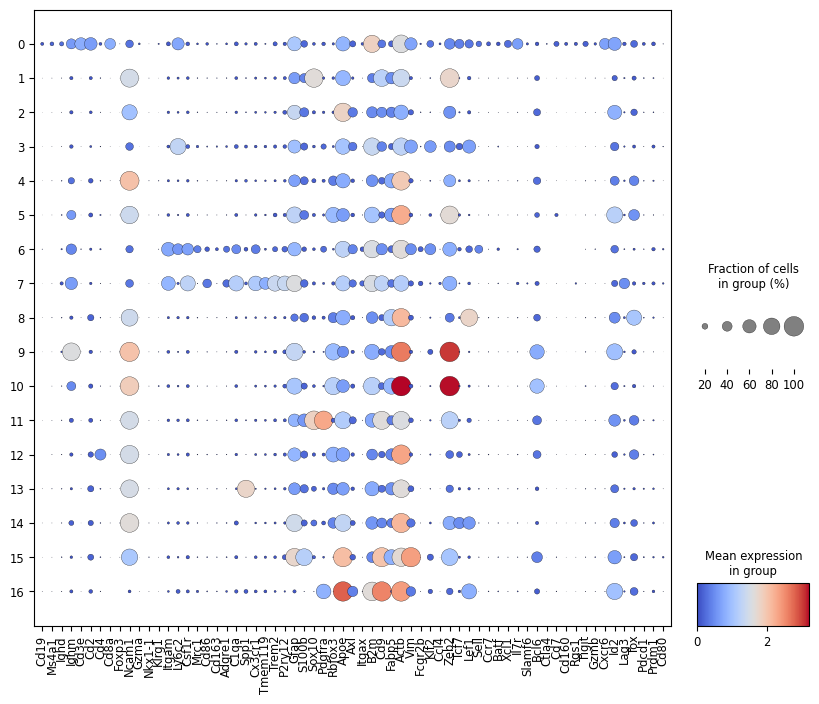

DotPlot: 65 genes across 17 clusters


In [17]:
GENE_GUIDE_PATH = Path("~/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/Gene List of sub-clustering/BRAIN_CLUSTERING_GUIDE_IRENE_Vs.xlsx").expanduser()
gene_guide = pd.read_excel(GENE_GUIDE_PATH, sheet_name="Long_format_all_genes")

# DotPlot for genes of interest
if gene_guide is not None:
    genes = gene_guide['Gene'].unique()
    genes_present = [g for g in genes if g in adata.var_names]
    
    if len(genes_present) > 0:
        sc.pl.dotplot(
            adata,
            var_names=genes_present,
            groupby="leiden",
            figsize=(10, 8),
            dendrogram=False,
            cmap="coolwarm",
            show=False
        )
        plt.tight_layout()
        plt.savefig("leiden_0.5_cluster_dotplot_genesOfInterest.png", dpi=300)
        plt.show()
        print(f"DotPlot: {len(genes_present)} genes across {adata.obs['leiden'].nunique()} clusters")


In [18]:
# Compute marker genes per leiden_0.5 cluster
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon", pts=True)
print("Computed marker genes per leiden_0.5 cluster")

# Print top 5 markers per cluster using the actual group labels stored by scanpy
ranked_groups = list(adata.uns["rank_genes_groups"]["names"].dtype.names)
for cluster in ranked_groups:
    names = adata.uns["rank_genes_groups"]["names"][cluster]
    top_5 = [str(gene) for gene in names[:10]]
    print(f"Cluster {cluster}: {', '.join(top_5)}")

Computed marker genes per leiden_0.5 cluster
Cluster 0: Il2rg, Sp100, Trbc1, B2m, Cd3e, Ccl5, Itgb2, Itga4, Itgb7, Itgal
Cluster 1: Car2, Sox10, Litaf, Olig2, S1pr5, Egr1, Cd9, Zeb2, Agpat4, Jam3
Cluster 2: S1pr1, Slc1a3, Sox9, Apoe, Vcam1, Mertk, Slc7a11, Notch1, Id2, Egfr
Cluster 3: Cxcl12, Ly6c2, Pecam1, Adgre5, Slc2a1, Klf2, Itga1, Prom1, Vim, Sp100
Cluster 4: Chga, Mdh1, Tubb3, Atp5g3, Sdha, Ndufb5, Pgam1, Tpi1, Cox5a, Idh3b
Cluster 5: Cx3cl1, Dclk1, Chgb, Nr4a1, Cacnb3, Ldha, Egr1, Icam5, Thy1, Srebf2
Cluster 6: Itgb2, Itgam, Adgre5, B2m, Mpeg1, Tgfb1, Cd44, Itgal, Sp100, Csf1r
Cluster 7: Trem2, C1qa, Csf1r, C1qc, Cx3cr1, P2ry12, Mpeg1, Itgam, Tgfbr1, Selplg
Cluster 8: Rora, Lef1, Tubb3, Thy1, Cited2, Cx3cl1, Ndufa10, Adam23, Pgam1, Mdh1
Cluster 9: Jun, Zeb2, Icam5, Cblb, Itga8, Ighm, Cxcl12, Foxo1, Xist, Hist1h2bc
Cluster 10: Zeb2, Icam5, Pfkl, Chgb, Gpm6b, Actb, Ifngr2, Cx3cl1, Ldha, Thy1
Cluster 11: Pdgfra, Olig2, Sox10, Cd9, Itgb8, Lrp1, Itga9, Itgav, Notch1, Dll1
Cluster 12:

Computed marker genes per leiden cluster


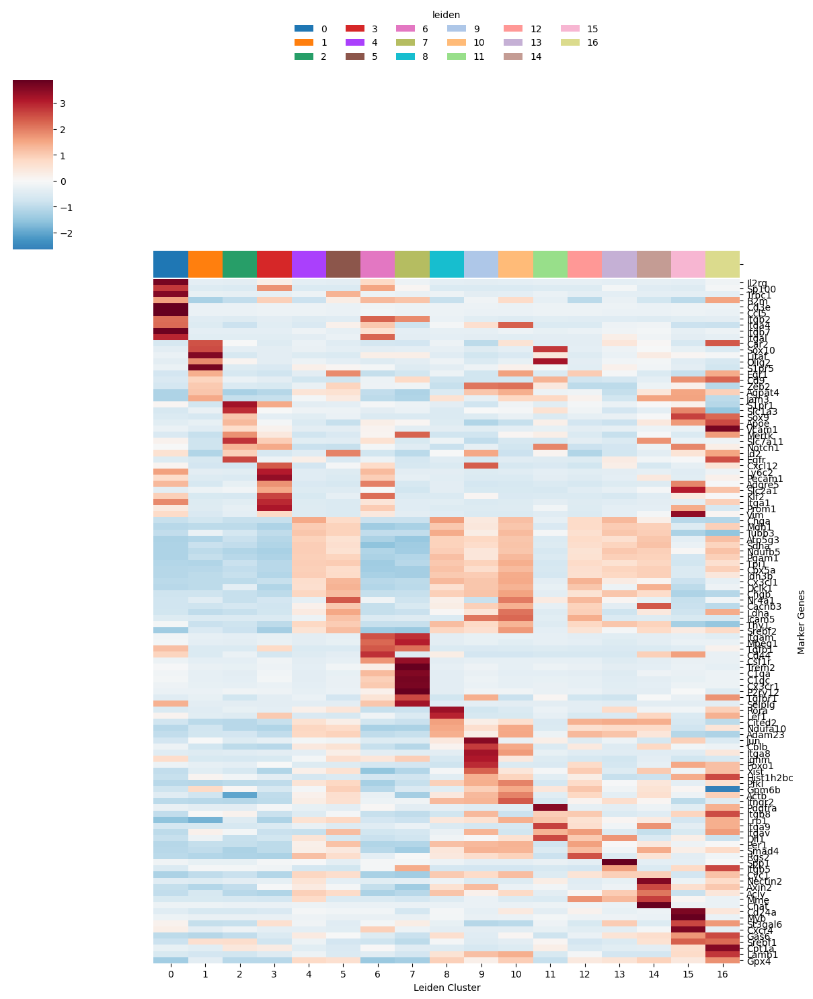

In [19]:

# Logarithmize data
sc.pp.log1p(adata)

CLUSTER_KEY = "leiden"  # change to "leiden_0.5" if that is the column you want

# Make sure cluster column is categorical
adata.obs[CLUSTER_KEY] = adata.obs[CLUSTER_KEY].astype("category")

# Compute marker genes
sc.tl.rank_genes_groups(
    adata,
    groupby=CLUSTER_KEY,
    method="wilcoxon",
    pts=True,
)

print(f"Computed marker genes per {CLUSTER_KEY} cluster")

# Get top DEGs
n_genes = 10
clusters = adata.uns["rank_genes_groups"]["names"].dtype.names

marker_genes = []
for cl in clusters:
    marker_genes.extend(adata.uns["rank_genes_groups"]["names"][cl][:n_genes])

marker_genes = list(dict.fromkeys(marker_genes))

# Average expression per cluster
expr = adata[:, marker_genes].to_df()
expr["cluster"] = adata.obs[CLUSTER_KEY].astype(str).values

avg_expr = expr.groupby("cluster", observed=True).mean().T

# Keep clusters in numeric order: 0, 1, 2, ..., 16
cluster_order = sorted(avg_expr.columns.astype(str), key=lambda x: int(x))

avg_expr = avg_expr.loc[:, cluster_order]

# Z-score genes
avg_expr_z = avg_expr.sub(avg_expr.mean(axis=1), axis=0)
avg_expr_z = avg_expr_z.div(avg_expr.std(axis=1).replace(0, np.nan), axis=0)
avg_expr_z = avg_expr_z.fillna(0)

# Get UMAP colors in the same numeric order
cluster_categories = adata.obs[CLUSTER_KEY].cat.categories.astype(str)
umap_colors = adata.uns[f"{CLUSTER_KEY}_colors"]
cluster_colors = dict(zip(cluster_categories, umap_colors))

col_colors = pd.Series(
    [cluster_colors[str(cl)] for cl in cluster_order],
    index=cluster_order,
)

g = sns.clustermap(
    avg_expr_z,
    row_cluster=False,
    col_cluster=False,
    col_colors=col_colors,
    cmap="RdBu_r",
    center=0,
    figsize=(12, 14),
    xticklabels=True,
    yticklabels=True,
)

g.ax_heatmap.set_xlabel("Leiden Cluster")
g.ax_heatmap.set_ylabel("Marker Genes")

# Legend in 0 -> 16 order
for cluster in cluster_order:
    g.ax_col_dendrogram.bar(
        0,
        0,
        color=cluster_colors[str(cluster)],
        label=str(cluster),
        linewidth=0,
    )

g.ax_col_dendrogram.legend(
    title=CLUSTER_KEY,
    loc="center",
    ncol=6,
    bbox_to_anchor=(0.5, 1.2),
    frameon=False,
)

g.savefig(
    f"{CLUSTER_KEY}_DEG_cluster_average_heatmap_08062026.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()


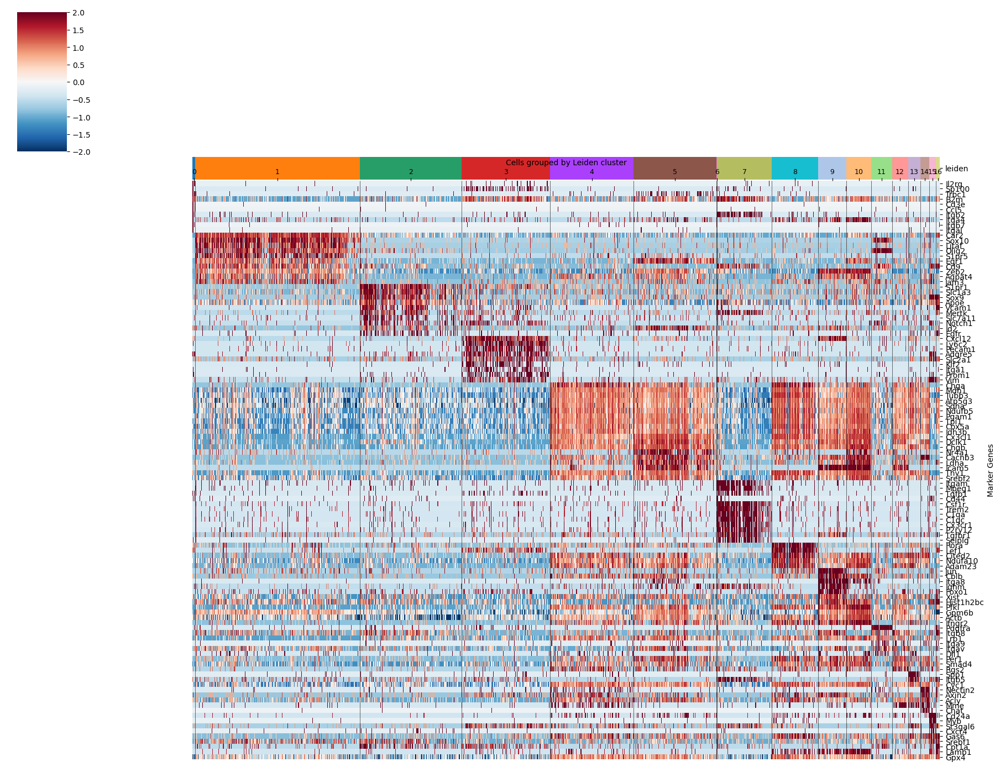

In [20]:
CLUSTER_KEY = "leiden"  # or "leiden"

# Make sure cluster labels are categorical
adata.obs[CLUSTER_KEY] = adata.obs[CLUSTER_KEY].astype("category")

# Expression matrix: cells x genes
expr_cells = adata[:, marker_genes].to_df()

# Cluster labels as strings
clusters_per_cell = adata.obs[CLUSTER_KEY].astype(str)

# Numeric cluster order: 0, 1, 2, ..., 16
cluster_order = sorted(
    clusters_per_cell.dropna().unique(),
    key=lambda x: int(x),
)

# Order cells by numeric cluster order
cluster_order_map = {cluster: i for i, cluster in enumerate(cluster_order)}

cell_order = (
    clusters_per_cell
    .map(cluster_order_map)
    .sort_values(kind="stable")
    .index
)

expr_cells_ordered = expr_cells.loc[cell_order].T  # genes x cells

# Scale data per gene: z-score rows
expr_cells_z = expr_cells_ordered.sub(expr_cells_ordered.mean(axis=1), axis=0)
expr_cells_z = expr_cells_z.div(expr_cells_ordered.std(axis=1).replace(0, np.nan), axis=0)
expr_cells_z = expr_cells_z.fillna(0)

# Ordered cluster labels for the heatmap columns
ordered_clusters = clusters_per_cell.loc[cell_order]

# Use the same default colors from UMAP
color_key = f"{CLUSTER_KEY}_colors"

cluster_categories = adata.obs[CLUSTER_KEY].cat.categories.astype(str)
umap_colors = adata.uns[color_key]

cluster_colors = dict(zip(cluster_categories, umap_colors))

col_colors = ordered_clusters.map(cluster_colors)

g2 = sns.clustermap(
    expr_cells_z,
    row_cluster=False,
    col_cluster=False,
    col_colors=col_colors,
    cmap="RdBu_r",
    xticklabels=False,
    yticklabels=True,
    figsize=(18, 14),
    vmin=-2,
    vmax=2,
)

g2.ax_heatmap.set_xlabel("Cells grouped by Leiden cluster")
g2.ax_heatmap.set_ylabel("Marker Genes")

# Cluster counts in 0 -> 16 order
cluster_counts = ordered_clusters.value_counts(sort=False)
cluster_counts = cluster_counts.loc[cluster_order]

cluster_starts = np.r_[0, np.cumsum(cluster_counts.values)[:-1]]
cluster_centers = cluster_starts + cluster_counts.values / 2

# Put cluster numbers on top of the HEATMAP axis
g2.ax_heatmap.set_xticks(cluster_centers)
g2.ax_heatmap.set_xticklabels(cluster_counts.index, rotation=0, fontsize=9)
g2.ax_heatmap.xaxis.tick_top()
g2.ax_heatmap.xaxis.set_label_position("top")

# Vertical lines separating clusters
for x in np.cumsum(cluster_counts.values)[:-1]:
    g2.ax_heatmap.axvline(x, color="black", linewidth=0.4)

# Save without bbox_inches="tight"
g2.savefig(
    f"{CLUSTER_KEY}_DEG_single_cell_scaled_heatmap_08062026.png",
    dpi=200,
)

plt.show()


### Clusters Annotation

In [21]:
CLUSTER_KEY = "leiden"

adata.obs[CLUSTER_KEY] = adata.obs[CLUSTER_KEY].astype("category")

# Keep clusters ordered 0 -> 16
cluster_order = sorted(
    adata.obs[CLUSTER_KEY].cat.categories.astype(str),
    key=lambda x: int(x),
)

# Get same colors as UMAP
cluster_colors = dict(
    zip(
        adata.obs[CLUSTER_KEY].cat.categories.astype(str),
        adata.uns[f"{CLUSTER_KEY}_colors"],
    )
)

violin_dir = WORKING_DIRECTORY / "violin_plots"
violin_dir.mkdir(parents=True, exist_ok=True)

for celltype in gene_guide["Type"].dropna().unique():
    genes = gene_guide.loc[gene_guide["Type"] == celltype, "Gene"].dropna().unique()
    genes_present = [g for g in genes if g in adata.var_names]

    if len(genes_present) == 0:
        print(f"No genes found for {celltype}")
        continue

    axs = sc.pl.violin(
        adata,
        keys=genes_present,
        groupby=CLUSTER_KEY,
        order=cluster_order,
        palette=cluster_colors,
        rotation=90,
        stripplot=False,
        multi_panel=True,
        show=False,
    )

    safe_celltype = str(celltype).replace("/", "_").replace(" ", "_")
    output_path = violin_dir / f"{CLUSTER_KEY}_{safe_celltype}_violin_08062026.png"

    plt.savefig(output_path, dpi=300, bbox_inches="tight")
    plt.close()

    print(f"Saved {output_path}")

/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_Bcells_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_Tcells_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_NKcells_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_Monocytes_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_Macrophages_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_Microglia_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_Astrocytes_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_OPCs_violin_08062026.png
No genes found for Oligodendrocytes


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_excitatory_neurons_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_Inhibitory_nuerons_violin_08062026.png
No genes found for Endothelial_cells


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_DAM_microglia_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_Hom_microglia_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_DAM_stage1_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_DAM_stage2_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_cd8_exh_int_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_cd8_exh_prog_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_cd8_exh_term_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_cd8_effector_like_violin_08062026.png


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:961: FutureWarning: 

Passing `palette

Saved /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/05_cluster_annotations/violin_plots/leiden_Dendritic_Cells_violin_08062026.png


                  leiden                  manual_celltype  \
AD_inf:aaafaeio-1      4  Hypothalamic inhibitory neurons   
AD_inf:aaagmbdg-1      4  Hypothalamic inhibitory neurons   
AD_inf:aaaicchl-1      1                 Oligodendrocytes   
AD_inf:aaaioeaf-1      3          Endothelial/Vasculature   
AD_inf:aaakaicd-1      4  Hypothalamic inhibitory neurons   

                         manual_celltype_with_cluster  
AD_inf:aaafaeio-1  4: Hypothalamic inhibitory neurons  
AD_inf:aaagmbdg-1  4: Hypothalamic inhibitory neurons  
AD_inf:aaaicchl-1                 1: Oligodendrocytes  
AD_inf:aaaioeaf-1          3: Endothelial/Vasculature  
AD_inf:aaakaicd-1  4: Hypothalamic inhibitory neurons  
manual_celltype
Oligodendrocytes                    26364
Parenchymal astrocytes              16318
Endothelial/Vasculature             14187
Hypothalamic inhibitory neurons     13393
Cortical excitatory neurons         13269
Microglia                            8738
Thalamic excitatory neurons  

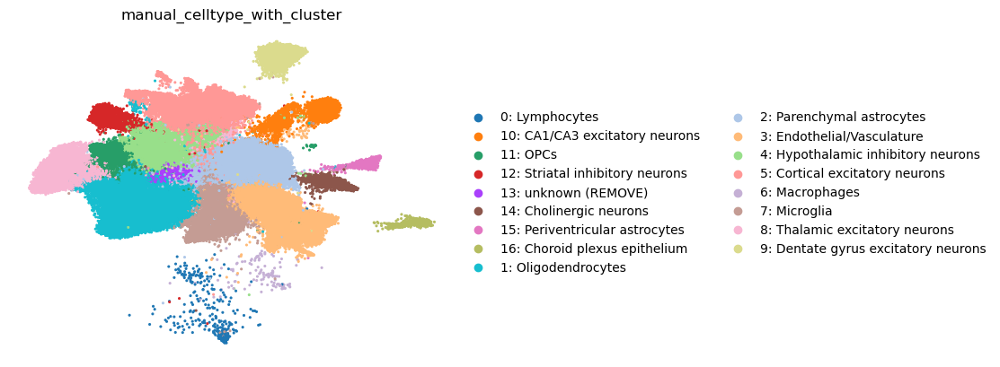

In [22]:
CLUSTER_KEY = "leiden"  # change to "leiden_0.5" if that is the clustering you want to annotate

leiden_annotation_map = {
    "0": "Lymphocytes",
    "1": "Oligodendrocytes",
    "2": "Parenchymal astrocytes",
    "3": "Endothelial/Vasculature",
    "4": "Hypothalamic inhibitory neurons",
    "5": "Cortical excitatory neurons",
    "6": "Macrophages",
    "7": "Microglia",
    "8": "Thalamic excitatory neurons",
    "9": "Dentate gyrus excitatory neurons",
    "10": "CA1/CA3 excitatory neurons",
    "11": "OPCs",
    "12": "Striatal inhibitory neurons",
    "13": "unknown (REMOVE)",
    "14": "Cholinergic neurons",
    "15": "Periventricular astrocytes",
    "16": "Choroid plexus epithelium",
}

adata.obs[CLUSTER_KEY] = adata.obs[CLUSTER_KEY].astype("category")

adata.obs["manual_celltype"] = (
    adata.obs[CLUSTER_KEY]
    .astype(str)
    .map(leiden_annotation_map)
    .astype("category")
)

adata.obs["manual_celltype_with_cluster"] = (
    adata.obs[CLUSTER_KEY].astype(str)
    + ": "
    + adata.obs["manual_celltype"].astype(str)
).astype("category")

print(adata.obs[["leiden", "manual_celltype", "manual_celltype_with_cluster"]].head())
print(adata.obs["manual_celltype"].value_counts())

axes = sc.pl.umap(
    adata,
    color=["manual_celltype_with_cluster"],
    frameon=False,
    wspace=0.45,
    size=20,
    show=False,
)

if isinstance(axes, list):
    fig = axes[0].figure
else:
    fig = axes.figure

fig.savefig(
    "UMAP_manual_annotation_20260617.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

fig.savefig(
    WORKING_DIRECTORY / "UMAP_manual_annotation_08062026.png",
    dpi=300,
    bbox_inches="tight",
)

In [23]:
adata.write_h5ad(WORKING_DIRECTORY / "06_manual_annotation_08062026.h5ad")

In [ ]:
# T cell subset - define clusters that are T cells
# Update this list based on your leiden_0.5 clusters identified as T cells
# For example: tcell_clusters = ['0', '1', '6', '7', '11', '13', '24'] in original data
# Adjust based on marker expression

tcell_clusters = None  # Set this based on your analysis
# Example: tcell_clusters = ['1', '6', '7', '11', '13', '24']

if tcell_clusters is not None:
    adata_tcells = adata[adata.obs['leiden_0.5'].astype(str).isin([str(c) for c in tcell_clusters])].copy()
    print(f"Extracted {adata_tcells.n_obs} T cells from {len(tcell_clusters)} clusters")
    print(f"T cell cluster distribution: {adata_tcells.obs['leiden_0.5'].value_counts().sort_index()}")
else:
    print("⚠️ Define tcell_clusters list based on your marker analysis above")
    print("Example: tcell_clusters = ['0', '3', '5']  # Update based on your data")

⚠️ Define tcell_clusters list based on your marker analysis above
Example: tcell_clusters = ['0', '3', '5']  # Update based on your data


In [ ]:
# Subclustering of T cells at higher resolution (if tcell_clusters was defined)
if tcell_clusters is not None and len(adata_tcells) > 0:
    # Recompute neighbors on T cells
    sc.pp.neighbors(
        adata_tcells,
        use_rep="X_scVI",
        n_neighbors=n_neighbors,
        key_added="tcell_scvi",
        random_state=random_seed,
    )
    
    # Compute UMAP for T cells
    sc.tl.umap(adata_tcells, neighbors_key="tcell_scvi", random_state=random_seed)
    
    # Leiden clustering at different resolutions
    for res in [0.3, 0.5, 0.8, 1.0]:
        sc.tl.leiden(
            adata_tcells,
            neighbors_key="tcell_scvi",
            resolution=res,
            random_state=random_seed,
            key_added=f"leiden_tcell_{res}",
        )
    
    print("Computed T cell subclustering and UMAP")
    print(f"T cell leiden_tcell_0.5 clusters: {sorted(adata_tcells.obs['leiden_tcell_0.5'].unique())}")
    
    # Plot T cells at different resolutions
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    for i, res in enumerate([0.3, 0.5, 0.8, 1.0]):
        ax = axes.flat[i]
        sc.pl.umap(adata_tcells, color=f"leiden_tcell_{res}", ax=ax, show=False, title=f"T cells resolution={res}")
    plt.tight_layout()
    plt.show()

In [ ]:
# T cell marker analysis (if T cells were defined)
if tcell_clusters is not None and len(adata_tcells) > 0:
    # Find markers for T cell subclusters
    sc.tl.rank_genes_groups(
        adata_tcells,
        groupby="leiden_tcell_0.5",
        method="t-test",
        use_raw=False,
        n_genes=20,
        pts=False,
    )
    
    # Plot dot plot for T cell subclusters
    top_genes_tcells = adata_tcells.uns["rank_genes_groups"]["names"][:, :5].flatten()
    top_genes_tcells = [g for g in top_genes_tcells if g in adata_tcells.var_names]
    
    sc.pl.dotplot(
        adata_tcells,
        var_names=list(dict.fromkeys(top_genes_tcells)),
        groupby="leiden_tcell_0.5",
        figsize=(10, 6),
        show=False,
    )
    plt.tight_layout()
    plt.show()
    
    print("T cell marker analysis complete")
    print(f"T cell clusters: {sorted(adata_tcells.obs['leiden_tcell_0.5'].unique())}")

In [ ]:
# # Save analysis results
# print("Analysis Summary:")
# print(f"Total cells: {adata.n_obs}")
# print(f"Total genes: {adata.n_vars}")
# print(f"Leiden clusters (res=1.0): {adata.obs['leiden'].nunique()}")
# print(f"Leiden clusters (res=0.5): {adata.obs['leiden_0.5'].nunique()}")
# if tcell_clusters is not None and len(adata_tcells) > 0:
#     print(f"T cells: {adata_tcells.n_obs}")
#     print(f"T cell subclusters (res=0.5): {adata_tcells.obs['leiden_tcell_0.5'].nunique()}")

# # Optionally save T cell object
# if tcell_clusters is not None and len(adata_tcells) > 0:
#     tcell_path = output_dir_resolved / "tcells_leiden_0.5.h5ad"
#     adata_tcells.write(tcell_path, compression='gzip')
#     print(f"✅ Saved T cell subset to {tcell_path}")

Analysis Summary:
Total cells: 119794
Total genes: 480
Leiden clusters (res=1.0): 17
Leiden clusters (res=0.5): 17


NameError: name 'output_path' is not defined